In [1]:
import pandas as pd
import numpy as np

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)



import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings(action='ignore')

In [2]:
import matplotlib.font_manager as fm
import os

# 나눔 폰트 경로 설정
dir = '/data1/E382/hwchoi/00.data/00.preprocessing'
font_path = os.path.join(dir, 'NANUMGOTHIC.TTF')

# 폰트 속성 설정
fontprop = fm.FontProperties(fname=font_path, size=10)


# 폰트 매니저에 폰트 추가
fm.fontManager.addfont(font_path)

# Matplotlib 폰트 캐시 파일 삭제 (필요시 사용)
cache_dir = os.path.expanduser('~/.cache/matplotlib')
font_cache_path = os.path.join(cache_dir, 'fontlist-v330.json')
if os.path.exists(font_cache_path):
    os.remove(font_cache_path)

# 폰트를 matplotlib에 설정
plt.rc('font', family=fontprop.get_name())

In [3]:
path='/home/hwchoi/001.project/data/T_PATIENTS_DAILY_WHOLE_0731.csv'
df=pd.read_csv(path)

In [4]:
df.columns

Index(['sido', 'create_date', 'sido_cd', 'weekend_yn', 'grid_x', 'grid_y',
       'sat_x', 'sat_y', 'min_ta', 'max_ta', 'mean_ta', 'gap_ta', 'min_tafeel',
       'max_tafeel', 'mean_tafeel', 'gap_tafeel', 'min_hm', 'max_hm',
       'mean_hm', 'gap_hm', 'min_wbtemp', 'max_wbtemp', 'mean_wbtemp',
       'gap_wbtemp', 'min_ws', 'max_ws', 'mean_ws', 'tropical_3days',
       'heatwave_temp', 'heatalert_temp', 'ta_min_3days', 'ta_max_3days',
       'gap_ta_minmax', 'popular_man', 'popular_woman', 'agriculture_man',
       'agriculture_woman', 'ta_min_am', 'ta_max_am', 'ta_mean_am',
       'ta_min_pm', 'ta_max_pm', 'ta_mean_pm', 'ta_min_six_am1',
       'ta_max_six_am1', 'ta_mean_six_am1', 'ta_min_six_am2', 'ta_max_six_am2',
       'ta_mean_six_am2', 'ta_min_six_pm1', 'ta_max_six_pm1',
       'ta_mean_six_pm1', 'ta_min_six_pm2', 'ta_max_six_pm2',
       'ta_mean_six_pm2', 'patientsCnt', 'instDate', 'updtDate'],
      dtype='object')

In [5]:
df['create_date'] = pd.to_datetime(df['create_date'])
df.sort_values(by='create_date', inplace=True)

df = df.rename(columns={'sido_cd':'unique_id', 'create_date':'ds', 'patientsCnt':'y'})

lst=['unique_id', 'ds', 'y']
data = df[lst]

In [6]:
data

,unique_id,ds,y
0,31,2014-05-01,0
16,23,2014-05-01,0
15,38,2014-05-01,0
14,26,2014-05-01,0
13,24,2014-05-01,0
11,25,2014-05-01,0
10,32,2014-05-01,0
9,39,2014-05-01,0
12,21,2014-05-01,0
7,11,2014-05-01,0


In [7]:
train = data.loc[data['ds'] < '2021-09-30']
valid = data.loc[(data['ds'] >= '2021-09-30')]
h = valid['ds'].nunique()
# valid['ds'] = pd.to_datetime(valid['ds'])

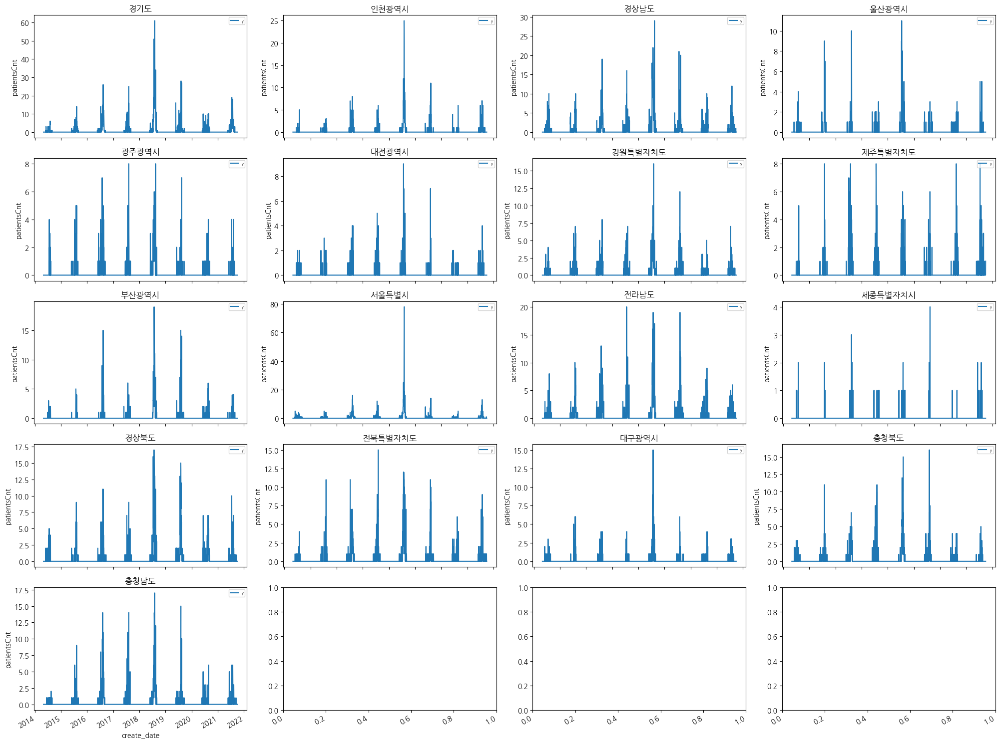

In [8]:
fig,ax = plt.subplots(5,4, figsize=(20,15))
ax = ax.flatten()

dt_map = {'39': '제주특별자치도', '32': '강원특별자치도', '25': '대전광역시', '21': '부산광역시',
          '24': '광주광역시', '26': '울산광역시', '38': '경상남도', '23': '인천광역시',
          '31': '경기도', '33': '충청북도', '22': '대구광역시', '35': '전북특별자치도',
          '37': '경상북도', '29': '세종특별자치시', '36': '전라남도', '11': '서울특별시', '34': '충청남도'}


p_ = train.set_index('ds')
for ax_, product in zip(ax, p_['unique_id'].unique()[:]):
    product_y = p_.loc[p_['unique_id'] == product, 'y']
    # ax_.set_title(f"{product}")
    ax_.set_title(dt_map.get(str(product), str(product)))
    ax_.plot(product_y, label='y')
    ax_.legend(loc='upper right', fontsize='xx-small')
    ax_.set_xlabel('create_date')
    ax_.set_ylabel('patientsCnt')

fig.autofmt_xdate()
fig.tight_layout()

In [9]:
from statsforecast import StatsForecast
from statsforecast.models import ADIDA, CrostonClassic, IMAPA, TSB

In [10]:
model = StatsForecast(models=[ ADIDA(), 
                                CrostonClassic(), 
                                IMAPA(), 
                                TSB(alpha_d=0.2, alpha_p=0.2)], freq='W', n_jobs=-1)
model.fit(train)

StatsForecast(models=[ADIDA,CrostonClassic,IMAPA,TSB])

In [11]:
p = model.predict(h=60)
# p['ds'] = pd.to_datetime(p['ds'])
p = p.reset_index().merge(valid, on=['ds', 'unique_id'], how='left')

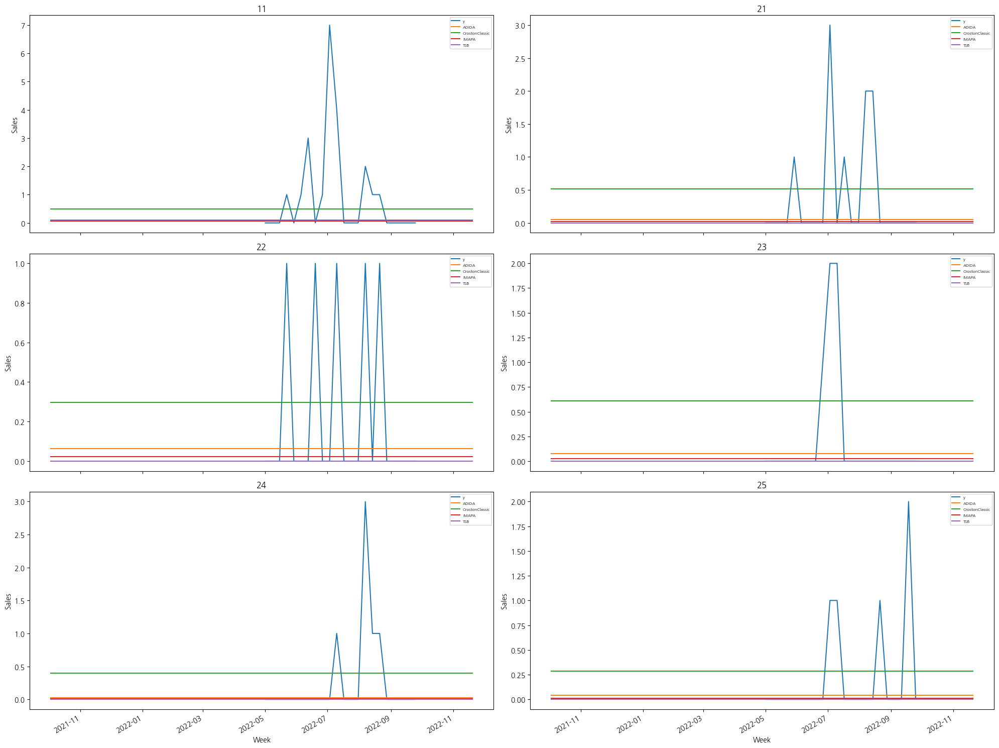

In [12]:
fig,ax = plt.subplots(3,2, figsize=(20,15))
ax = ax.flatten()

p_ = p.set_index('ds')
for ax_, product in zip(ax, p_['unique_id'].unique()[:]):
    product_y = p_.loc[p_['unique_id'] == product, 'y']
    ax_.set_title(f"{product}")
    ax_.plot(product_y, label='y')
    
    for model_ in ['ADIDA', 'CrostonClassic', 'IMAPA', 'TSB']:
        product_p = p_.loc[p_['unique_id'] == product, model_]
        ax_.plot(product_p, label=model_)
        ax_.set_xlabel('Week')
        ax_.set_ylabel('Sales')
    ax_.legend(loc='upper right', fontsize='xx-small')

fig.autofmt_xdate()
fig.tight_layout()

In [13]:
# 데이터 로드
path='/home/hwchoi/001.project/data/T_PATIENTS_DAILY_WHOLE_0731.csv'
df = pd.read_csv(path)

# create_date에 대한 sorting 적용 및 전처리
df['create_date'] = pd.to_datetime(df['create_date'])
df.sort_values(by=['sido_cd', 'create_date'], inplace=True)
df.fillna(0, inplace=True)

In [14]:
# Croston's Method 함수 정의
def croston(ts, extra_periods=1, alpha=0.4):
    d = np.array(ts)  # Transform the input into a numpy array
    cols = len(d)  # Historical period length
    d = np.append(d, [0] * extra_periods)  # Append np.nan into the demand array to cover future periods
    f = np.full(cols + extra_periods, np.nan)  # Forecast array
    q = np.full(cols + extra_periods, np.nan)  # Periods between demands array
    p = np.full(cols + extra_periods, np.nan)  # Forecasted demand array
    
    # Initialization
    first_occurence = np.argmax(d[:cols] > 0)
    f[first_occurence] = d[first_occurence]
    q[first_occurence] = 1 + first_occurence
    p[first_occurence] = d[first_occurence]

    for t in range(first_occurence + 1, cols):
        if d[t] > 0:
            p[t] = alpha * d[t] + (1 - alpha) * p[t - 1]
            q[t] = alpha * (t - first_occurence) + (1 - alpha) * q[t - 1]
            f[t] = p[t] / q[t]
            first_occurence = t
        else:
            f[t] = f[t - 1]
            p[t] = p[t - 1]
            q[t] = q[t - 1]
    
    # Future periods
    f[cols:] = p[cols - 1] / q[cols - 1]
    
    return f

# 시도별 예측 수행
sido_forecasts = {}
unique_sido_cds = df['sido_cd'].unique()
all_forecasts = pd.DataFrame()

for sido_cd in unique_sido_cds:
    data_sido = df[df['sido_cd'] == sido_cd]
    data_sido = data_sido.set_index('create_date').resample('D').sum()  # 일별 데이터로 리샘플링
    patients_cnt = data_sido['patientsCnt'].values
    forecast = croston(patients_cnt, extra_periods=30)  # 30일 예측
    data_sido['forecast'] = forecast[:-30]
    data_sido['sido_cd'] = sido_cd
    sido_forecasts[sido_cd] = data_sido
    all_forecasts = pd.concat([all_forecasts, data_sido.reset_index()])

In [15]:
# 예측값과 실제값 비교 데이터프레임 생성
comparison_df = all_forecasts[['create_date', 'sido_cd', 'patientsCnt', 'forecast']]
comparison_df = comparison_df.dropna()  # 결측치 제거

print(comparison_df)

     create_date  sido_cd  patientsCnt   forecast
29    2014-05-30       11            1   1.000000
30    2014-05-31       11            0   1.000000
31    2014-06-01       11            5   0.138298
32    2014-06-02       11            0   0.138298
33    2014-06-03       11            0   0.138298
34    2014-06-04       11            0   0.138298
35    2014-06-05       11            0   0.138298
36    2014-06-06       11            0   0.138298
37    2014-06-07       11            0   0.138298
38    2014-06-08       11            0   0.138298
39    2014-06-09       11            1   0.135359
40    2014-06-10       11            0   0.135359
41    2014-06-11       11            0   0.135359
42    2014-06-12       11            0   0.135359
43    2014-06-13       11            0   0.135359
44    2014-06-14       11            0   0.135359
45    2014-06-15       11            3   0.214286
46    2014-06-16       11            0   0.214286
47    2014-06-17       11            0   0.214286


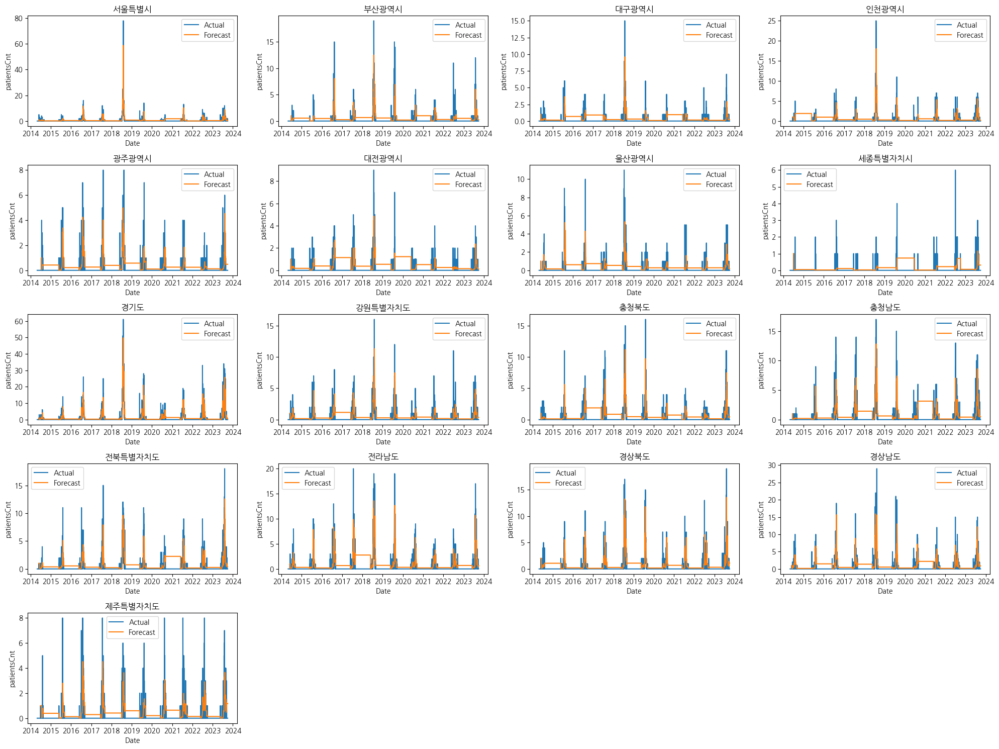

In [16]:
# 예측 결과 시각화
plt.figure(figsize=(20, 15))

dt_map = {'39': '제주특별자치도', '32': '강원특별자치도', '25': '대전광역시', '21': '부산광역시',
          '24': '광주광역시', '26': '울산광역시', '38': '경상남도', '23': '인천광역시',
          '31': '경기도', '33': '충청북도', '22': '대구광역시', '35': '전북특별자치도',
          '37': '경상북도', '29': '세종특별자치시', '36': '전라남도', '11': '서울특별시', '34': '충청남도'}

for i, (sido_cd, data_sido) in enumerate(sido_forecasts.items()):
    plt.subplot(5, 4, i+1)
    plt.rc('font', family=fontprop.get_name())
    plt.plot(data_sido.index, data_sido['patientsCnt'], label='Actual')
    plt.plot(data_sido.index, data_sido['forecast'], label='Forecast')
    plt.title(dt_map.get(str(sido_cd), str(sido_cd)))
    plt.xlabel('Date')
    plt.ylabel('patientsCnt')
    plt.legend()

plt.tight_layout()
plt.show()

In [17]:
# 조건을 만족하는 행 추출 및 인덱스 재설정
subset_32 = comparison_df[comparison_df['sido_cd'] == 32].reset_index(drop=True)
for i in range(0, len(subset_32)):
    print(subset_32['create_date'][i], subset_32['patientsCnt'][i], subset_32['forecast'][i])

2014-06-01 00:00:00 1 1.0
2014-06-02 00:00:00 0 1.0
2014-06-03 00:00:00 0 1.0
2014-06-04 00:00:00 0 1.0
2014-06-05 00:00:00 0 1.0
2014-06-06 00:00:00 0 1.0
2014-06-07 00:00:00 0 1.0
2014-06-08 00:00:00 0 1.0
2014-06-09 00:00:00 0 1.0
2014-06-10 00:00:00 0 1.0
2014-06-11 00:00:00 0 1.0
2014-06-12 00:00:00 0 1.0
2014-06-13 00:00:00 0 1.0
2014-06-14 00:00:00 0 1.0
2014-06-15 00:00:00 1 0.04032258064516129
2014-06-16 00:00:00 3 0.11780104712041888
2014-06-17 00:00:00 0 0.11780104712041888
2014-06-18 00:00:00 0 0.11780104712041888
2014-06-19 00:00:00 0 0.11780104712041888
2014-06-20 00:00:00 0 0.11780104712041888
2014-06-21 00:00:00 0 0.11780104712041888
2014-06-22 00:00:00 0 0.11780104712041888
2014-06-23 00:00:00 0 0.11780104712041888
2014-06-24 00:00:00 0 0.11780104712041888
2014-06-25 00:00:00 0 0.11780104712041888
2014-06-26 00:00:00 0 0.11780104712041888
2014-06-27 00:00:00 0 0.11780104712041888
2014-06-28 00:00:00 1 0.10595647193585338
2014-06-29 00:00:00 0 0.10595647193585338
2014-0